# Análisis de Datos en formato ECG
## Brenda Romero Solano
## Escuela de Ingeniería Eléctrica, Universidad de Costa Rica
### Contextualización del proyecto
Desde hace un siglo, la humanidad se ha dado la tarea de investigar de qué manera visualizar con mayor eficacia el funcionamiento del corazón, uno de los órganos más importantes dentro del cuerpo de los seres vivos, con el fin de diagnosticar distintas patologías que pueden resultar siendo dañinas para los individuos.

Este proyecto tiene como objetivo aprender a analizar distintas señales provenientes de electrocardiogramas mediante el uso del lenguaje de programación Python 3 con el fin de descubrir la frecuencia cardiaca de un ser vivo almacenada en archivos de audio .wav.

En su esencia, este curso es una fuente de conocimiento útil que brinda a los estudiantes las herramientas conceptuales y técnicas necesarias para adentrarse en el mundo de las señales eléctricas, incluidas las señales cardíacas.Se aprenden los fundamentos de la teoría de señales, lo que les permitirá comprender mejor conceptos importantes como el dominio de frecuencia y tiempo. Estos conceptos son fundamentales para el análisis de señales, y son particularmente relevantes para el electrocardiograma (ECG), una herramienta crucial para evaluar la actividad eléctrica del corazón.

También ofrece una introducción al mundo del análisis de sistemas lineales. Con este conocimiento, los estudiantes pueden investigar cómo los sistemas biológicos, como el corazón, reaccionan an una variedad de estímulos y condiciones. Esta perspectiva es muy útil para interpretar la información de un electrocardiograma porque permite una comprensión más profunda de cómo las señales del corazón pueden cambiar en respuesta a factores internos y externos.


### Configuración inicial de ondas
Primeramente, se importaron las bibliotecas  numpy, random wave, sys y matplotlib.pyplot que permitiran el manejo de los datos, su análisis y la presentación de los de los resultados por medio de gráficas. También se realizó la configuración inicial que generalmente deben tener los datos recibidos de los archivos .wav, como el tamaño de la fuente para el texto, la numeración de las figuras presentadas y el grosor de la línea a utilizar.

In [1]:
# Imports python libraries
import numpy as np
import random as rd
import wave
import sys
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
from scipy.signal import butter, lfilter, filtfilt #para filtrar datos
from statistics import stdev

# Comandos para crear figuras en alta resolución
%config InlineBackend.figure_formats = {'png', 'retina'} 
plt.rcParams['axes.labelsize'] = 16 # Tamaño de fuente para etiquetas de las figuras 
plt.rcParams['axes.titlesize'] = 18 # Tamaño de fuente para títulos de las figuras 
plt.rcParams['font.size'] = 14 # Tamaño de fuente para números de las figuras 
plt.rcParams['lines.linewidth'] = 1.4 # Ancho de la línea del gráfico

### Extracción de la información
A continuación, se procedió a crear una función cuyo objetivo es facilitar la extracción de la información más relevante de los archivos de tipo .wav. Esta función recibe como parámetro la ubicación del archivo en cuestión y se encarga de llevar a cabo una serie de operaciones para obtener datos cruciales relacionados con la señal de audio contenida en dicho archivo.

La función utiliza la biblioteca 'wave' para abrir el archivo especificado en la ruta proporcionada. Una vez cargado el archivo, la función se encarga de extraer la cantidad de canales de grabación presentes en el archivo, la cantidad total de cuadros de audio y, por último, la tasa de muestreo que representa la cantidad de muestras de audio tomadas por segundo. Además, la función también se encarga de obtener la propia señal de audio. Los datos de la señal se extraen del archivo y se convierten en un formato adecuado para su posterior procesamiento.

In [2]:
#Función que extrae la cantidad de canales de grabación, la tasa de muestreo, el tiempo y la señal
#path dirección donde se encuentra el archivo .wav 
def ecg(path):
    record = wave.open(path, 'r') # Cargar el archivo

    # Obtener el número de canales y demás datos
    numChannels = record.getnchannels() #Cantidad de canales
    numFrames = record.getnframes() #Cantidad de cuadros
    sampleRate = record.getframerate() #Tasa de muestreo 
    sampleWidth = record.getsampwidth()
    
    # Obtener los datos de la onda
    dstr = record.readframes(numFrames * numChannels)
    waveData = np.frombuffer(dstr, np.int16)

    # Obtener el tiempo
    timeECG = np.linspace(0, len(waveData)/sampleRate, num=len(waveData))

    return timeECG, waveData

A continuación, se procede a obtener las gráficas que pertenecen a las muestras seleccionadas mediante un bucle que genera las figuras solicitadas por el enunciado, al utilizar la función "ecg" definida anteriormente. 

El bucle fue construido de manera que recorra los índices de las muestras y siga el formato de su nommbre, en el ejemplo dado, las muestras están almacenadanas en la misma carpeta que este archivo.Dentro del mismo se obtienen los detalles de la señal y se procede a crear el gráfico configuranto el tamaño de la figura, rotulando los ejes y el gráfico en si, de modo que la variable contador a lo largo del documento, almacenará el número de gráfico a crear.

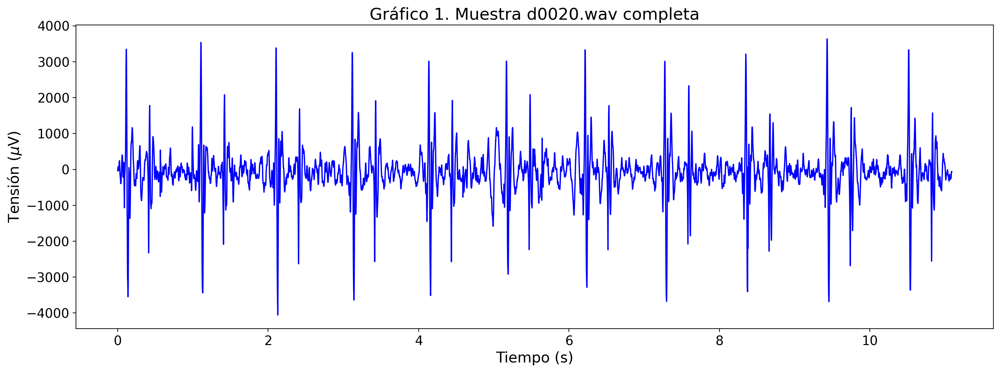

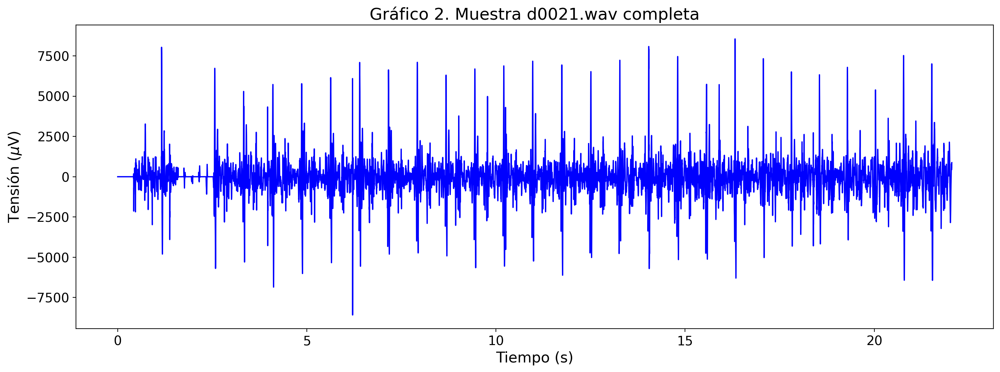

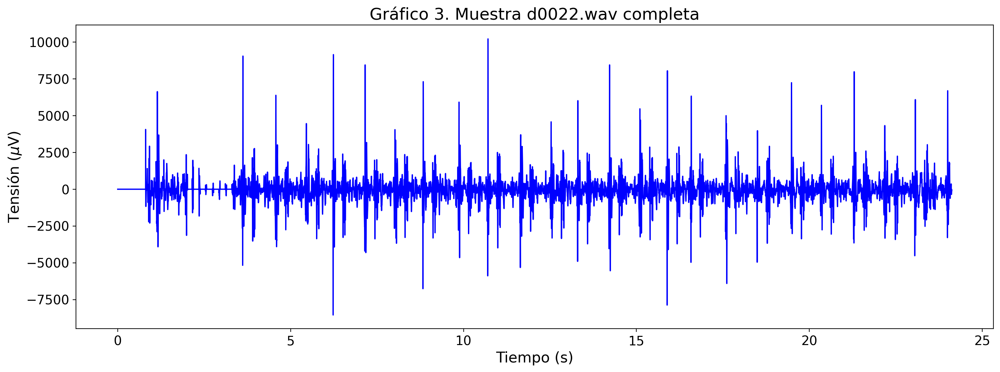

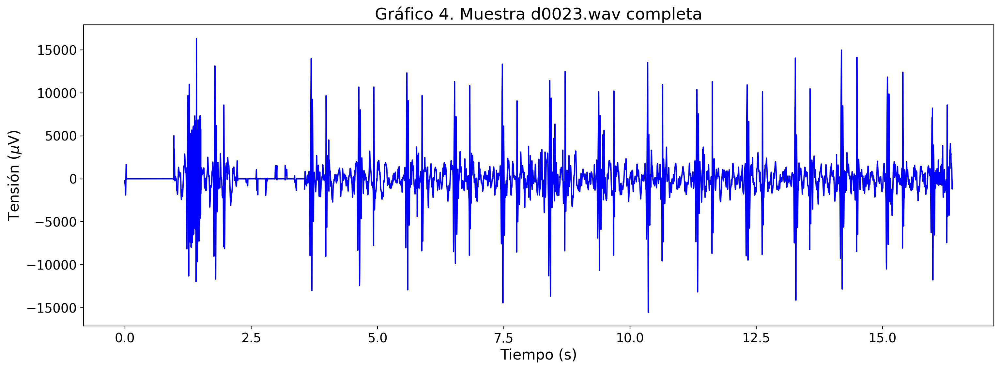

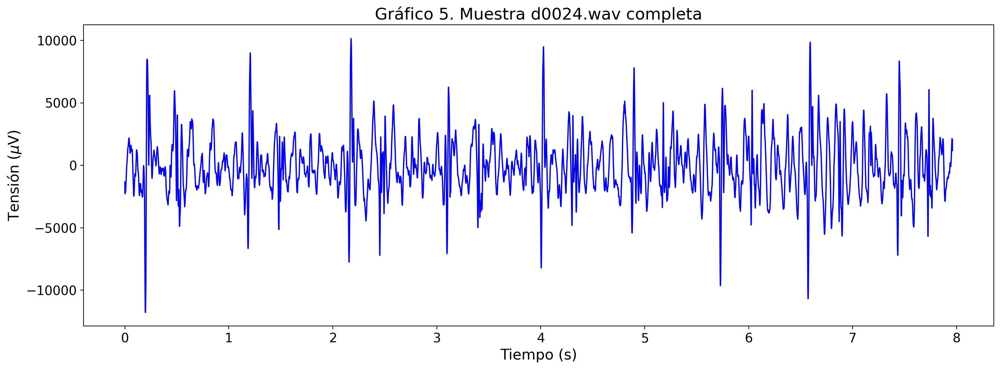

...

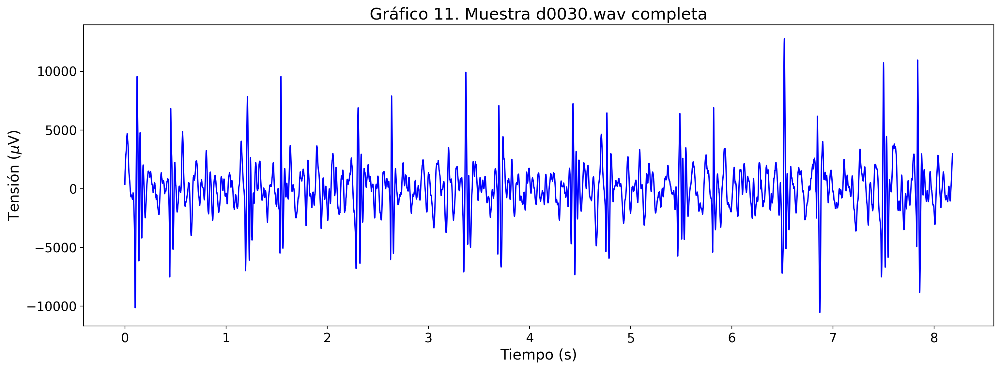

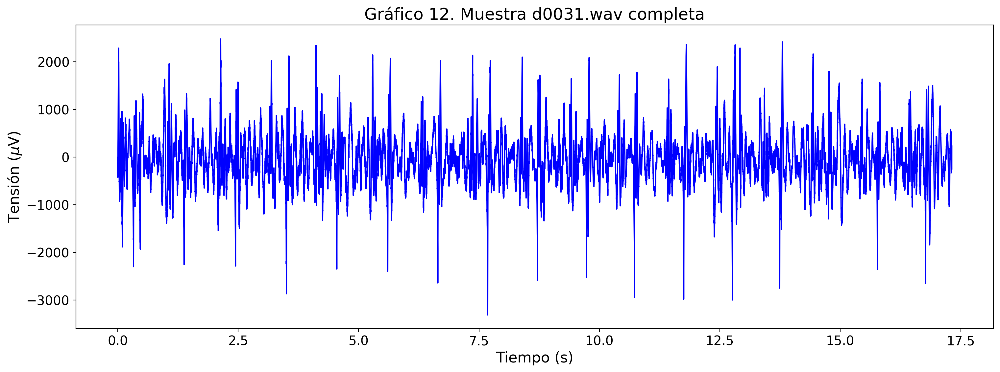

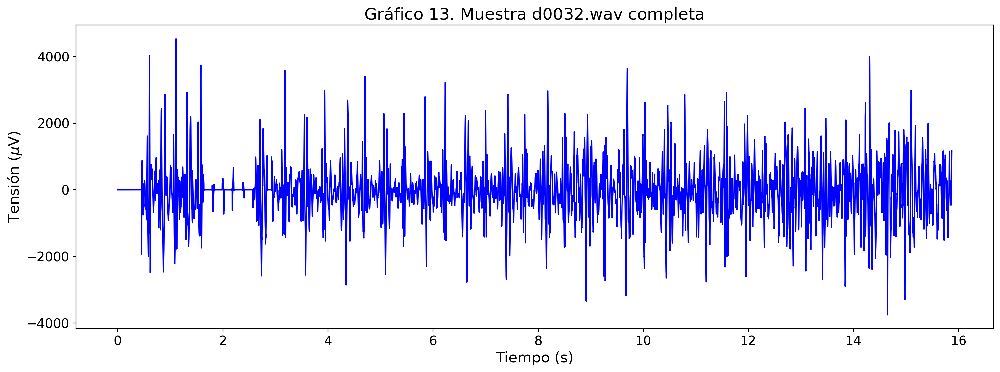

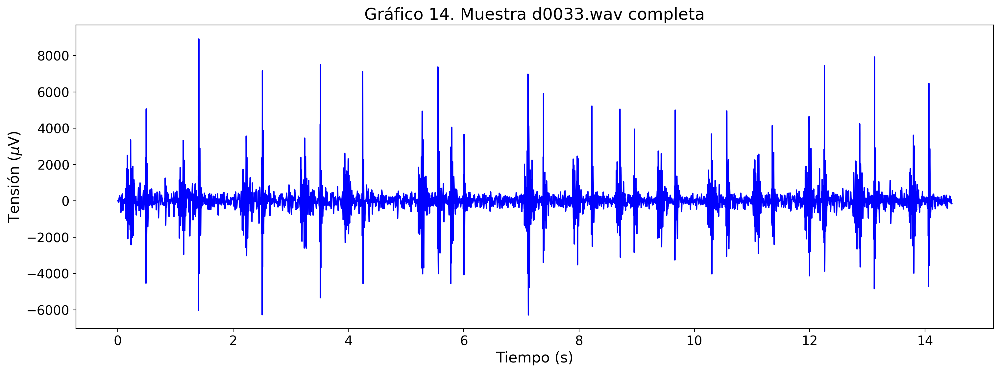

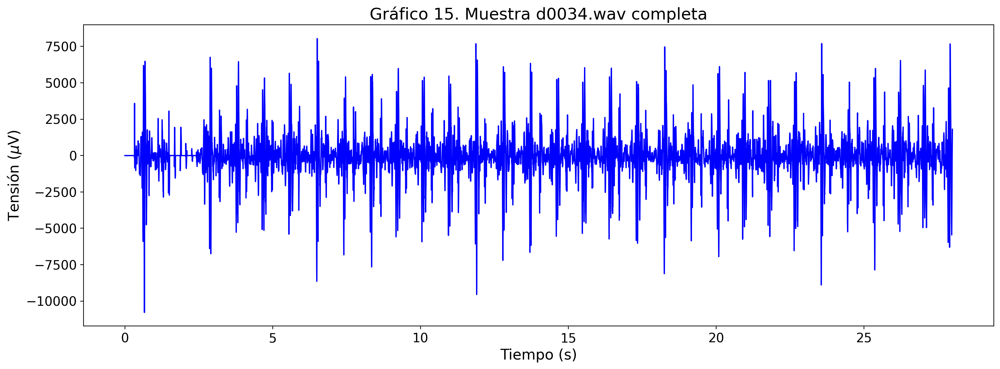

In [3]:
contador = 1
for i in range(20, 35):
    timeECG, waveData = ecg('d00' + str(i) +'.wav')
    # Gráficar la señal
    plt.figure(figsize=(18,6))
    plt.xlabel(r'Tiempo (s)')
    plt.ylabel(r'Tensión ($\mu$V)')
    plt.plot(timeECG,waveData, 'b')
    plt.title('Gráfico ' + str(contador) + '. Muestra d00' + str(i) +'.wav completa')
    contador += 1
    plt.show()

Con el fin de obtener una mejor visualización de la ondas seleccionadas, se procedió a realizar un acercamiento de las mismas al recortar la extensión de la señal. Se eligió el intervalo de 3 a 4.40 segundos con el fin de capturar un valor cercano a la mitad de la duración de la muestra. Lo anterior se logra al cambiar los límites del eje x del gráfico de mostrar todos los valores a mostrar solo el intérvalo seleccionado. Para amplificar otro segmento de las muestras, solo se debe cambiar el intervalo escogido en la función xlim del siguiente código.

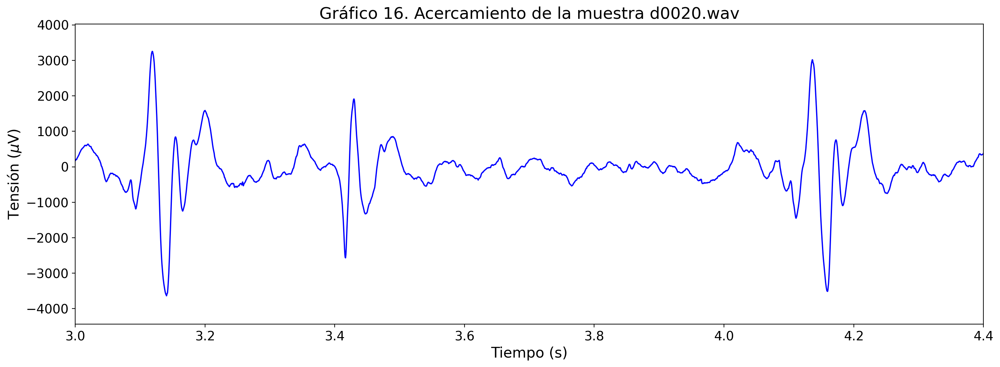

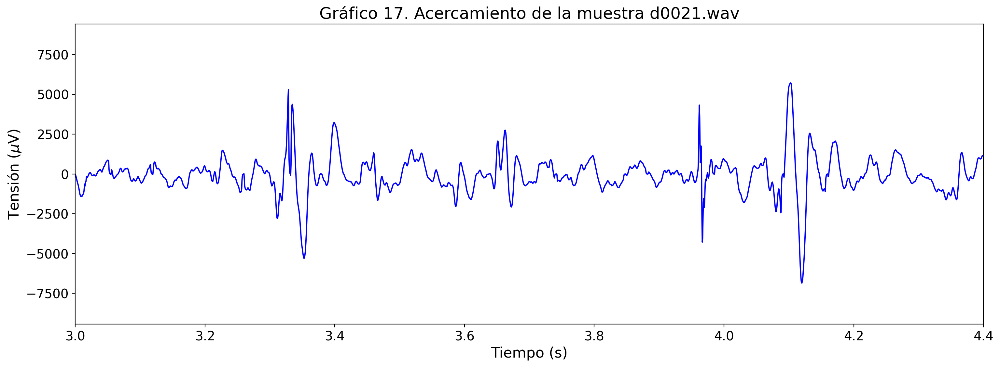

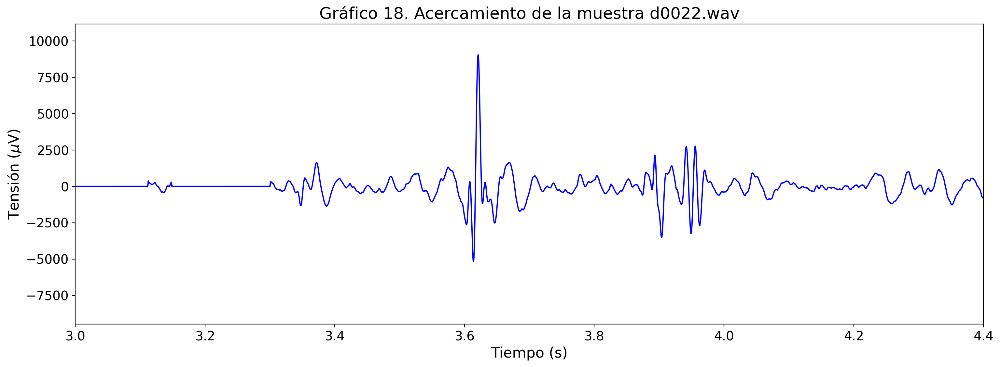

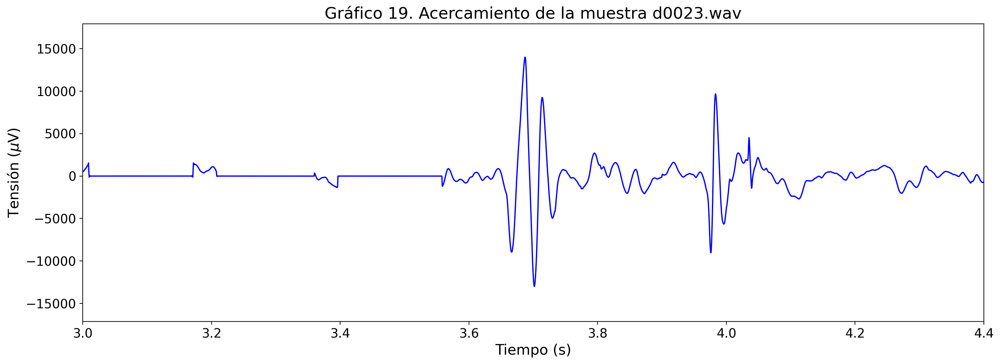

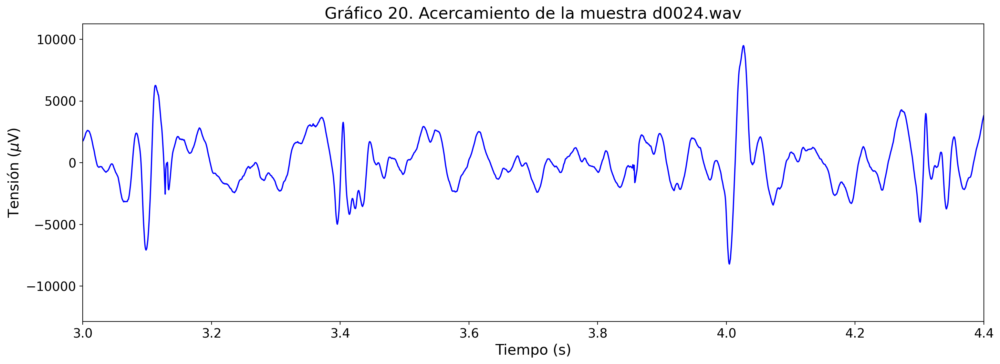

...

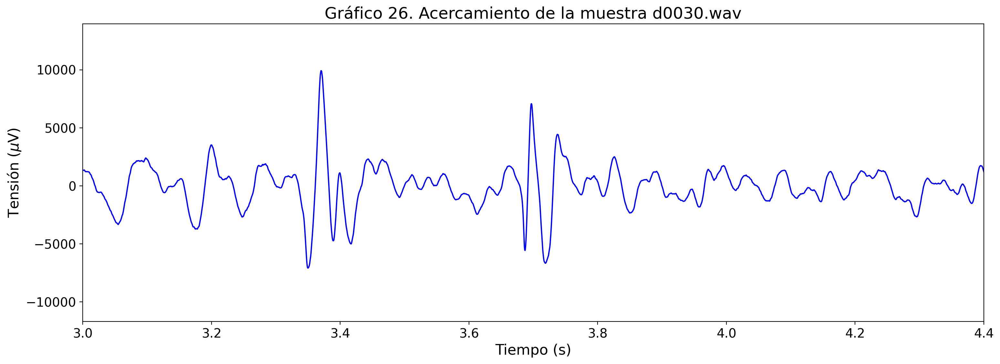

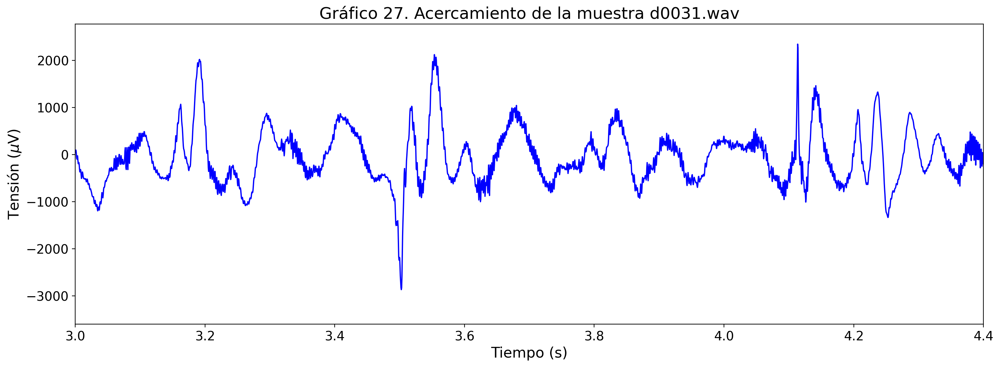

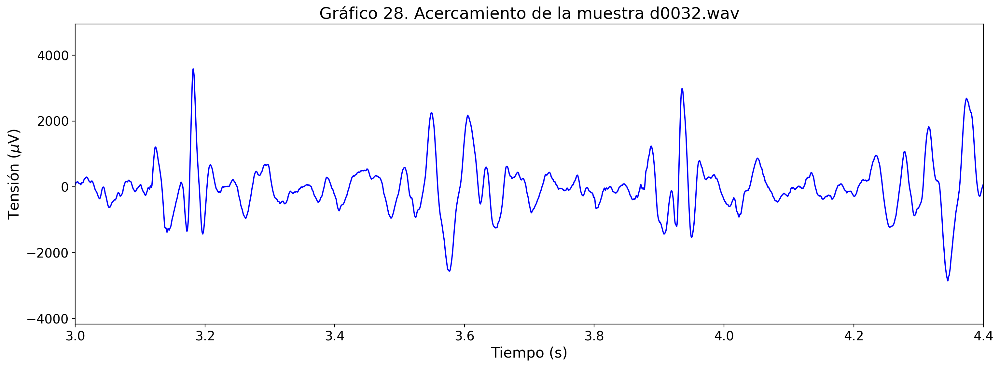

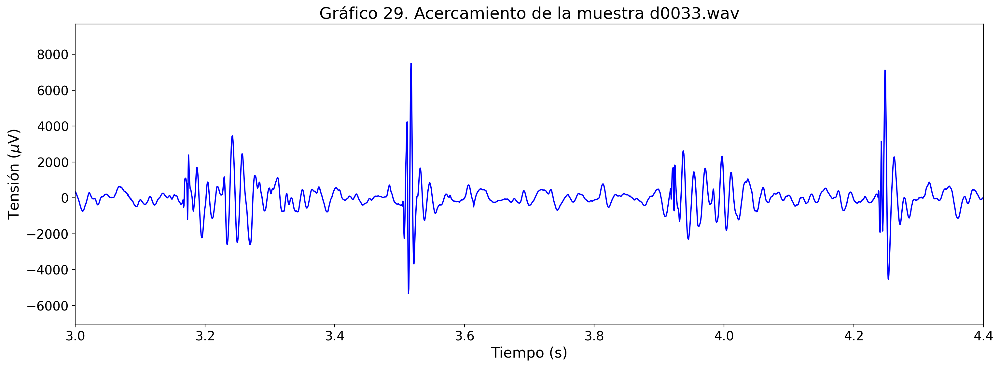

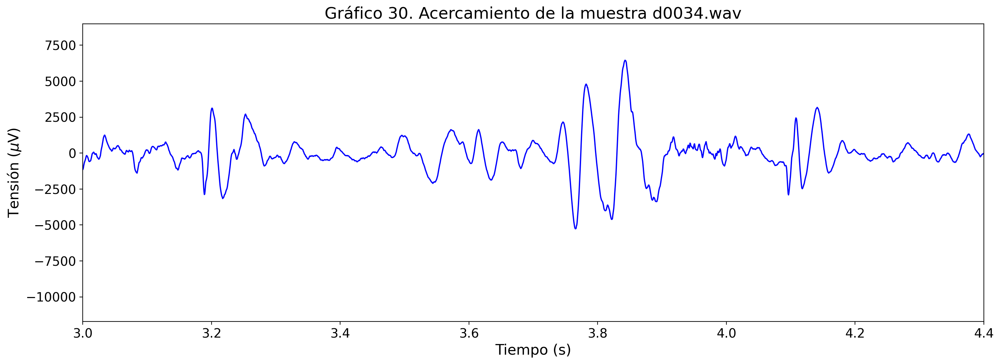

In [4]:
for i in range(20, 35):
    timeECG, waveData = ecg('d00' + str(i) +'.wav')
    # Gráficar la señal
    plt.figure(figsize=(18,6))
    plt.xlabel(r'Tiempo (s)')
    plt.ylabel(r'Tensión ($\mu$V)')
    plt.plot(timeECG,waveData, 'b')
    plt.xlim(3,4.40) #Cambio en los límites del gráfico 
    plt.title('Gráfico ' +  str(contador) + '. Acercamiento de la muestra d00' + str(i) +'.wav')
    contador += 1
    plt.show()

### Mayor amplitud de los datos
Con el fin de encontrar la mayor amplitud de los datos, se procedió a identificar los máximos locales de cada señal seleccionada mediante la función "detecta_maximos_locales", la cual recibe los datos de la señal y un valor umbral pretederminado de 0.6 que permite obtener de manera más adecuada los máximos de las señales, en caso de que los valores de pico R no se detecten correctamente, a la hora de usar la función se debe de disminuir el valor de umbral, mientras que si se detectan también las ondas de tipo T, se deberá aumentar el este valor. 

In [5]:
def detecta_maximos_locales(timeECG, waveData, threshold_ratio=0.6):

    if len(timeECG) != len(waveData): #Dispara una excepción si dos arreglos no tiene el mismo tamaño
        raise Exception("The two arrays have different lengths.")
    
    interval = max(waveData) - min(waveData)
    threshold = threshold_ratio*interval + min(waveData)
    maxima = []
    maxima_indices = []
    mxs_indices = []
    banner = False
    
    for i in range(0, len(waveData)):
            
        if waveData[i] >= threshold:#Si un valor es mayor al límite calculado, el índice y el valor se guardado
            banner = True
            maxima_indices.append(i)
            maxima.append(waveData[i])
            
        elif banner == True and waveData[i] < threshold: #Si se cruza el valor umbral
            # se guarda el índice del valor máximo en la matriz original
            index_local_max = maxima.index(max(maxima))
            mxs_indices.append(maxima_indices[index_local_max])
            maxima = []
            maxima_indices = []
            banner = False     

    return mxs_indices

Después, se procedió a crear una función que se encarge de encontrar el mayor valor de una lista y devuelva no solo el valor si no también un indice que se utilizará para reconocer a que archivo pertenece dicho valor.

In [6]:
def detectar_maximo(datos, maximo,archivoActual,indice):
    for dato in datos:
        if dato > maximo:
            maximo = dato
            indice = archivoActual
    return maximo, indice

A continuación, se procede a iterar alrededor de todas las muestras seleccionadas para graficar las gráficas de las mismas con sus respectivos máximos; aprovechando el ciclo, también se calculo cual es la mayor amplitud entre todas las señáles.

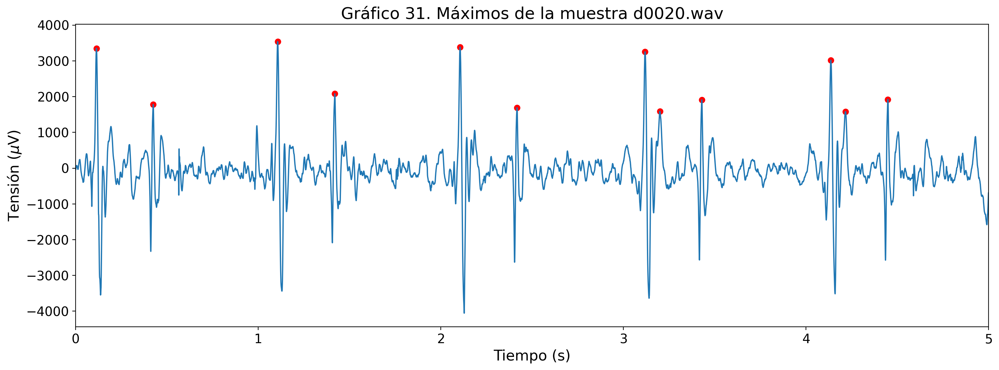

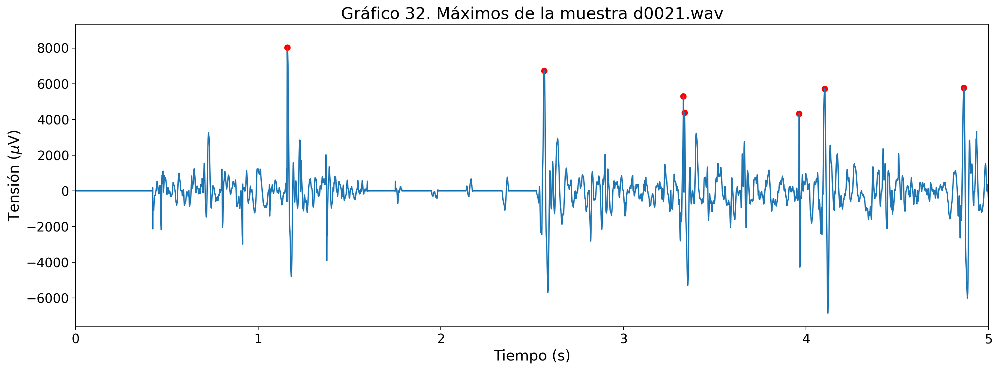

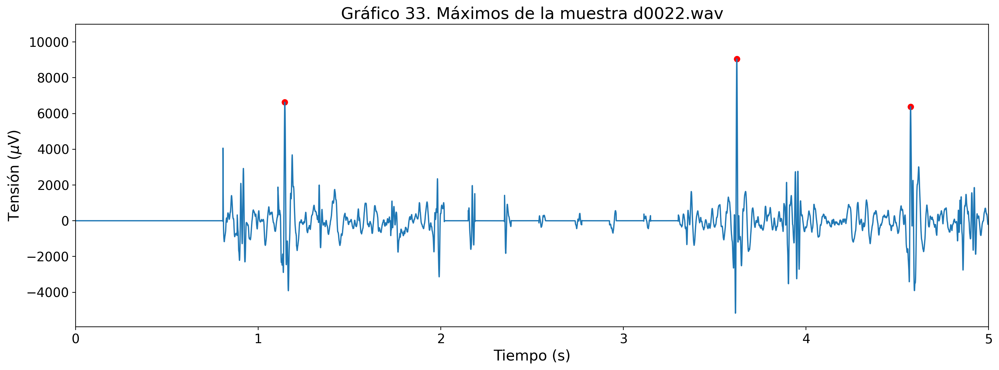

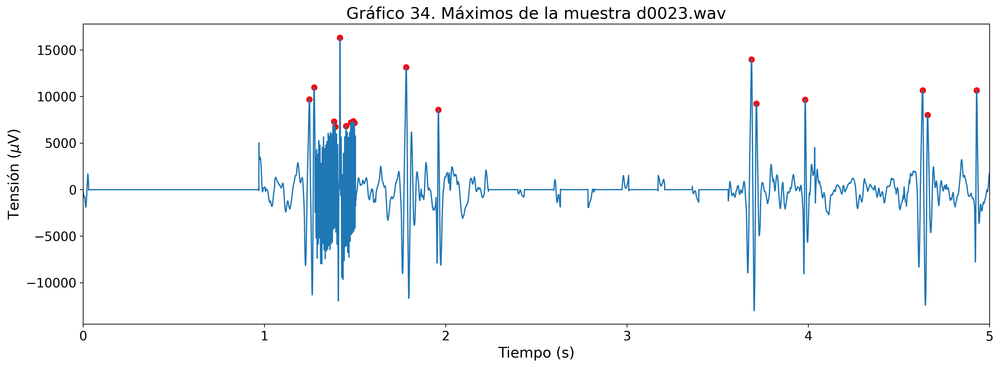

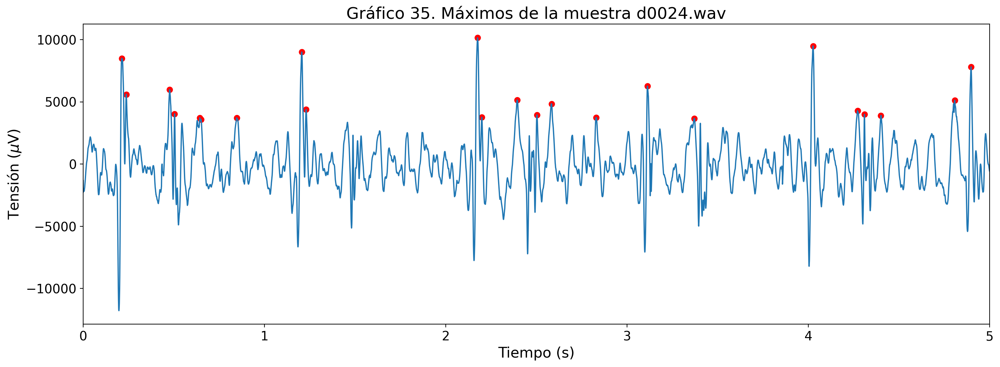

...

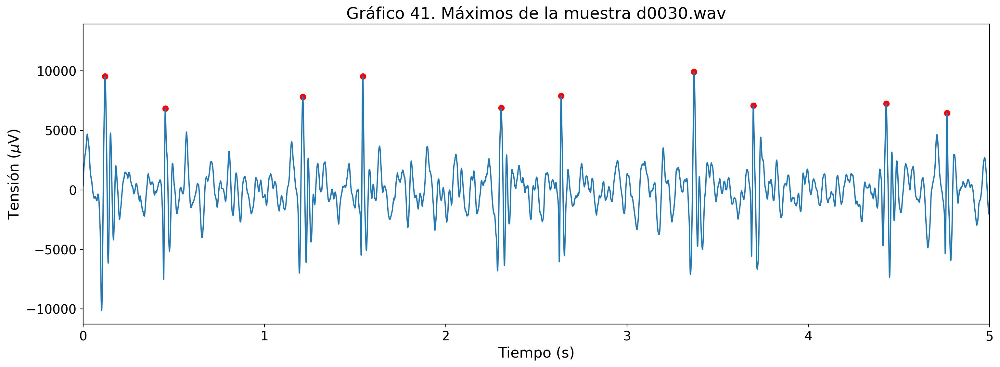

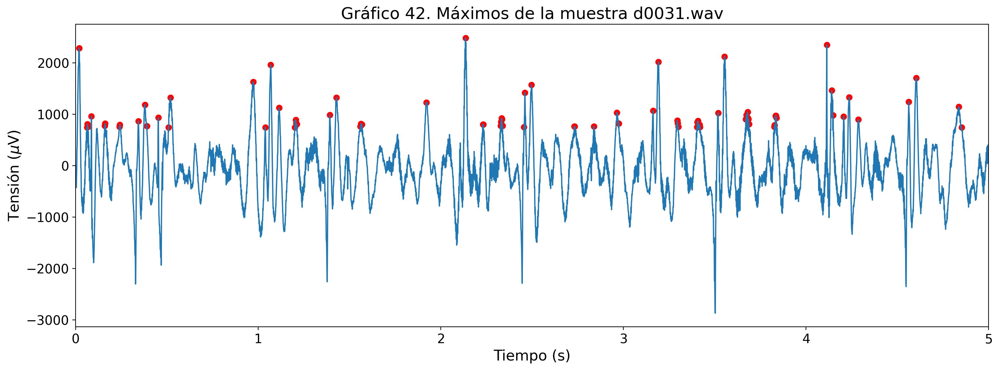

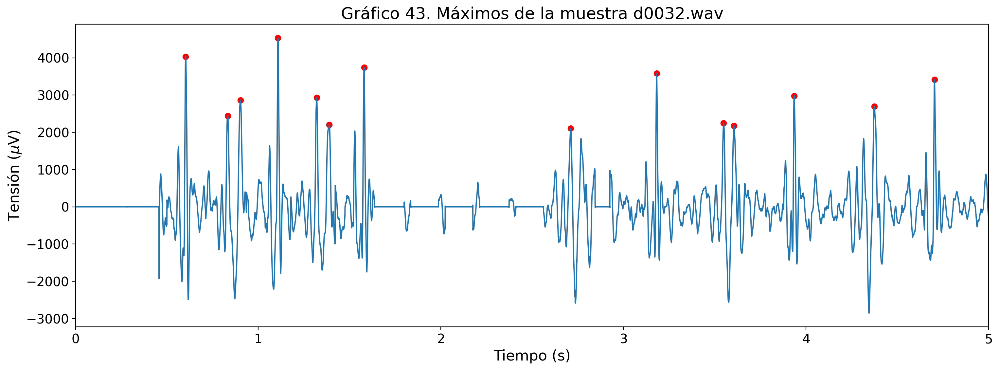

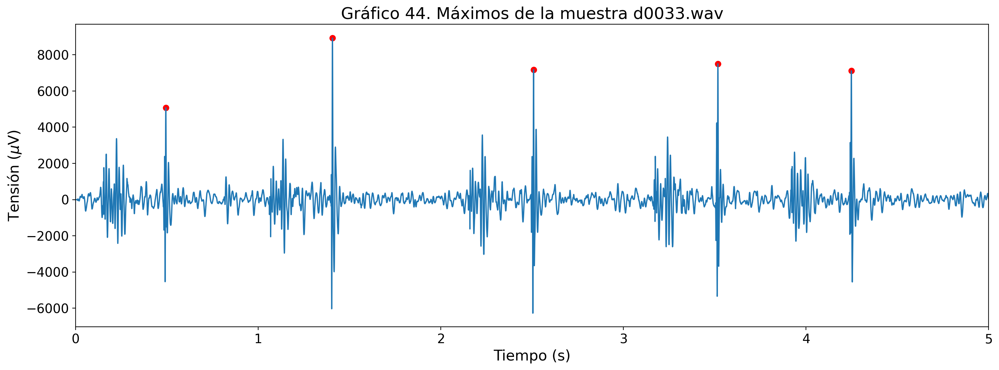

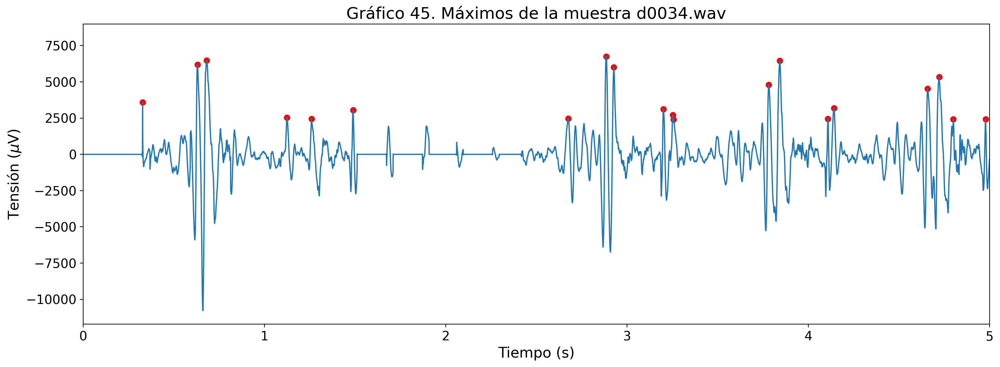

In [7]:
maximo = 0
indice = 20
for i in range(20, 35):
    timeECG, waveData = ecg('d00' + str(i) +'.wav')
    mxs_indices = detecta_maximos_locales(timeECG, waveData,0.7)
    maximo, indice = detectar_maximo(waveData[mxs_indices],maximo,i, indice)#Detecta la muestra con mayor amplitud
    # Gráficar la señal
    init_sec = 0
    end_sec = 1
    plt.figure(figsize=(18,6))
    plt.xlabel(r'Tiempo (s)')
    plt.ylabel(r'Tensión ($\mu$V)')
    plt.xlim(timeECG[init_sec*10000],timeECG[end_sec*10000])
    plt.plot(timeECG[init_sec*10000:end_sec*10000], waveData[init_sec*10000:end_sec*10000])
    plt.scatter(timeECG[mxs_indices], waveData[mxs_indices], color='r')
    plt.title('Gráfico ' +  str(contador) + '. Máximos de la muestra d00' + str(i) +'.wav')
    contador += 1
    plt.show()

Una vez ejecutado el código anterior, se muestra la gráfica que tiene la mayor amplitud de los datos.

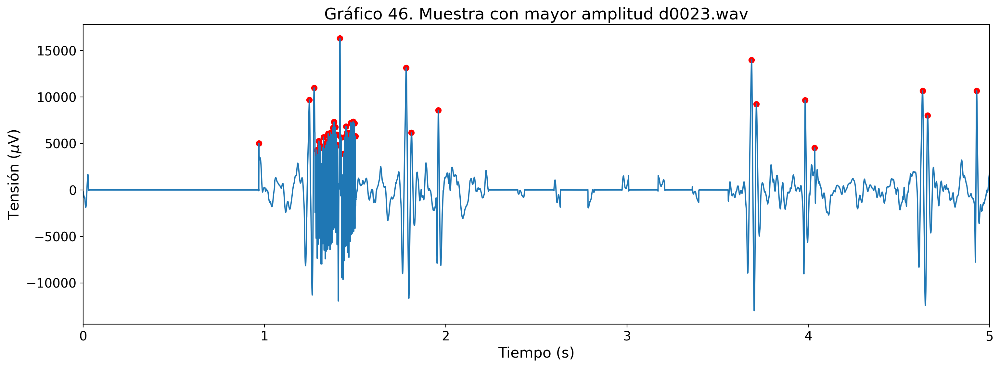

In [8]:
timeECG, waveData = ecg('d00' + str(indice) +'.wav')
mxs_indices = detecta_maximos_locales(timeECG, waveData)
# Graficación de la muestra
init_sec = 0
end_sec = 1
plt.figure(figsize=(18,6))
plt.xlabel(r'Tiempo (s)')
plt.ylabel(r'Tensión ($\mu$V)')
plt.xlim(timeECG[init_sec*10000],timeECG[end_sec*10000])
plt.plot(timeECG[init_sec*10000:end_sec*10000], waveData[init_sec*10000:end_sec*10000])
plt.scatter(timeECG[mxs_indices], waveData[mxs_indices], color='r')
plt.title('Gráfico ' +  str(contador) + '. Muestra con mayor amplitud d00' + str(indice) +'.wav')
contador += 1
plt.show()

### Gráficos de muestra seleccionados
Con el fin de analizar el comportamiento de una muestra especifica, se seleccionó la señal número d0032.wav, donde por medio de la función "detecta_maximos_locales" se encontraron los valores de pico R presentes en dicha toma de datos. Un valor de pico R esta presente solo una vez a lo durante de un latido, por lo que para mostrar en el gráfico uno solo de estos, la función "xlim" debe ser configurada para mostrar un intervalo que comprenda 3 latidos en total, de modo que en el latido del medio sea completamente visible. Del mismo modo para motrar una cantidad n de latidos, el intervalo seleccionado deberá tener una longitud de n+2 valores. Por lo que en dicha función se configura según un máximo deseasdo de la lsita de "mxs_indices" que contiene el indice correspondiente a cada máximo de la señal. 

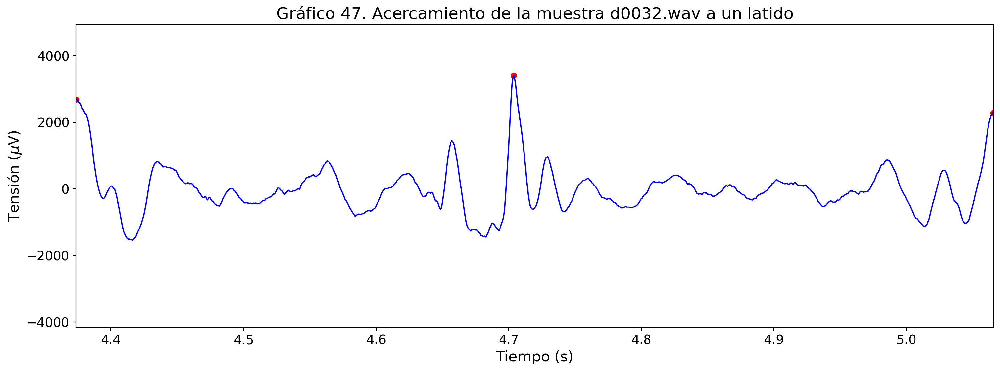

In [9]:
timeECG, waveData = ecg('d0032.wav')
mxs_indices = detecta_maximos_locales(timeECG, waveData,0.7)
# Graficación de la señal
plt.figure(figsize=(18,6))
plt.xlabel(r'Tiempo (s)')
plt.ylabel(r'Tensión ($\mu$V)')
plt.plot(timeECG,waveData, 'b')
plt.xlim(timeECG[mxs_indices][12],timeECG[mxs_indices][14])
plt.scatter(timeECG[mxs_indices], waveData[mxs_indices], color='r')
plt.title('Gráfico ' +  str(contador) + '. Acercamiento de la muestra d0032.wav a un latido')
contador += 1
plt.show()

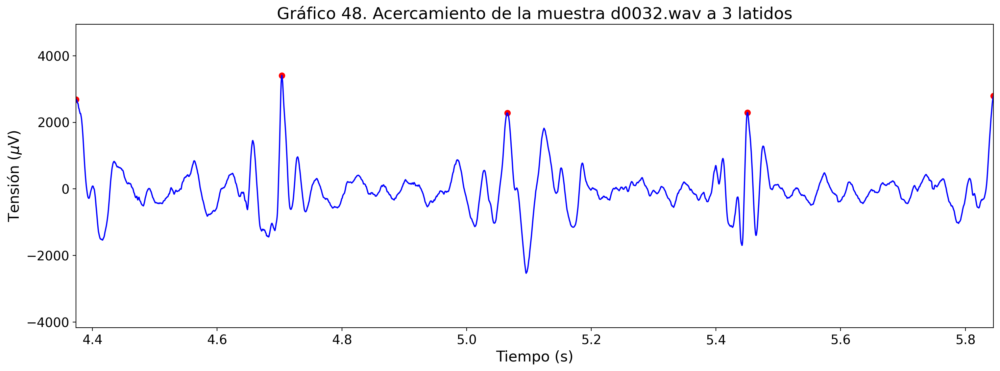

In [10]:
timeECG, waveData = ecg('d0032.wav')
mxs_indices = detecta_maximos_locales(timeECG, waveData,0.7)
# Graficación de la señal
plt.figure(figsize=(18,6))
plt.xlabel(r'Tiempo (s)')
plt.ylabel(r'Tensión ($\mu$V)')
plt.plot(timeECG,waveData, 'b')
plt.xlim(timeECG[mxs_indices][12],timeECG[mxs_indices][16])
plt.scatter(timeECG[mxs_indices], waveData[mxs_indices], color='r')
plt.title('Gráfico ' +  str(contador) + '. Acercamiento de la muestra d0032.wav a 3 latidos')
contador += 1
plt.show()

### Cálculo de la frecuencia cardiaca

El archivo de audio se carga y procesa para calcular y visualizar la frecuencia cardíaca de cada electrocardiograma. También se extrae información sobre el tiempo y las señales del electrocardiograma. Luego, se utiliza la función detecta_maximos_locales para encontrar los puntos máximos en la señal del ECG, con un umbral de 0.78. El código calcula la frecuencia cardíaca promedio en latidos por minuto para ese electrocardiograma específico utilizando estos máximos identificados. Este cálculo se basa en la cantidad de máximos que se han encontrado y la duración de la señal en su totalidad.

Finalmente, el electrocardiograma se representa en un gráfico que muestra la frecuencia cardíaca a lo largo del tiempo. La línea roja muestra la frecuencia cardíaca promedio, mientras que el área sombreada alrededor de la línea muestra la variabilidad. Esto nos permite ver cómo cambia la frecuencia cardíaca en ese electrocardiograma específico.

Latidos por minuto de la muestra d0020: 75.754


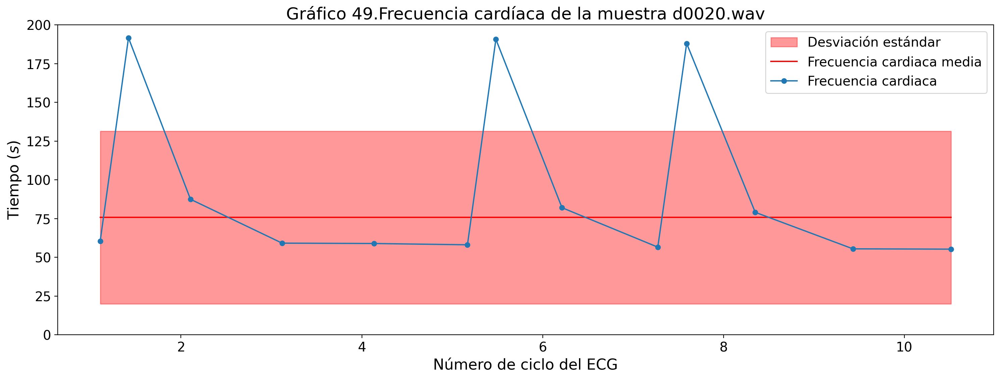

Latidos por minuto de la muestra d0021: 81.633


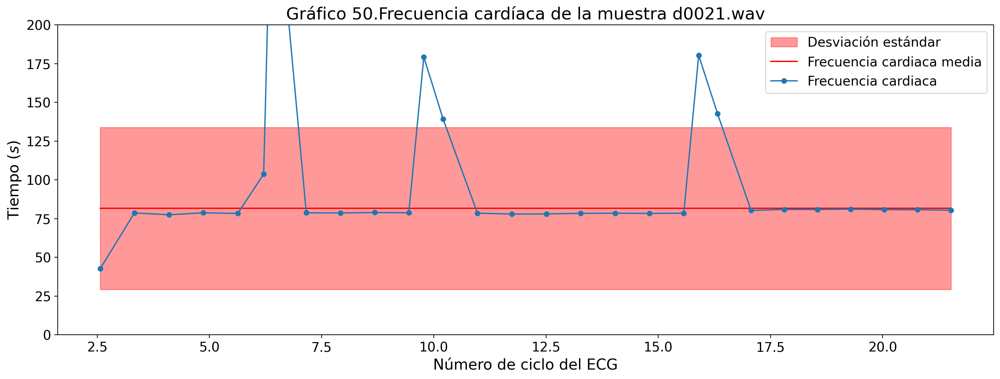

Latidos por minuto de la muestra d0022: 34.826


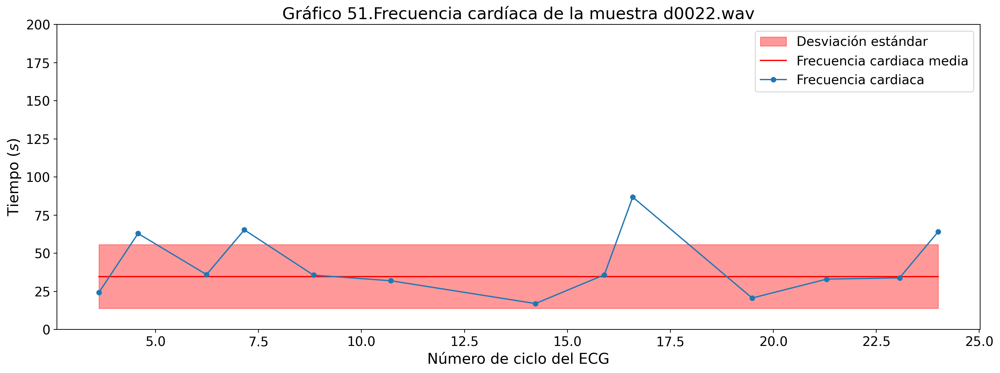

Latidos por minuto de la muestra d0023: 113.553


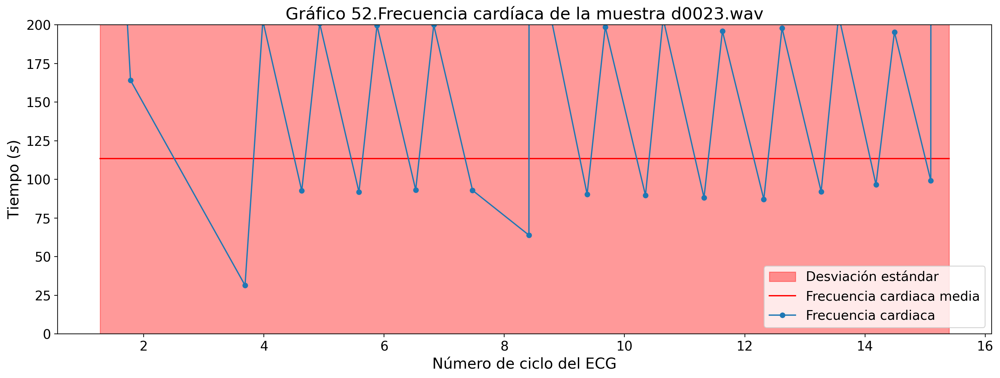

Latidos por minuto de la muestra d0024: 113.065


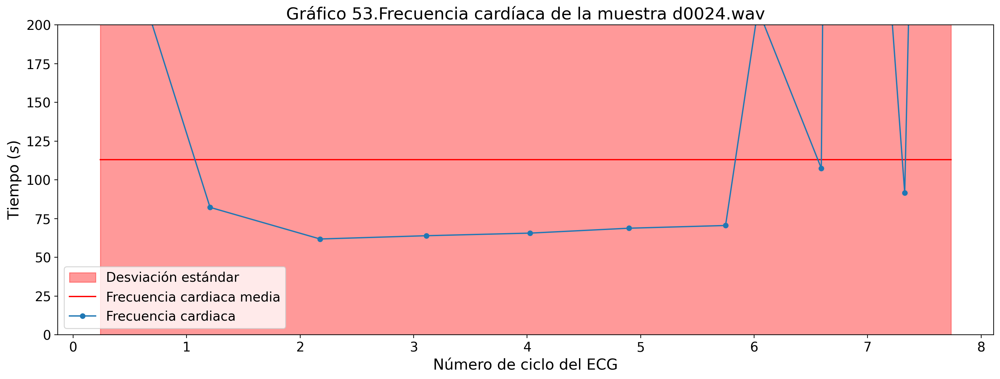

Latidos por minuto de la muestra d0025: 67.227


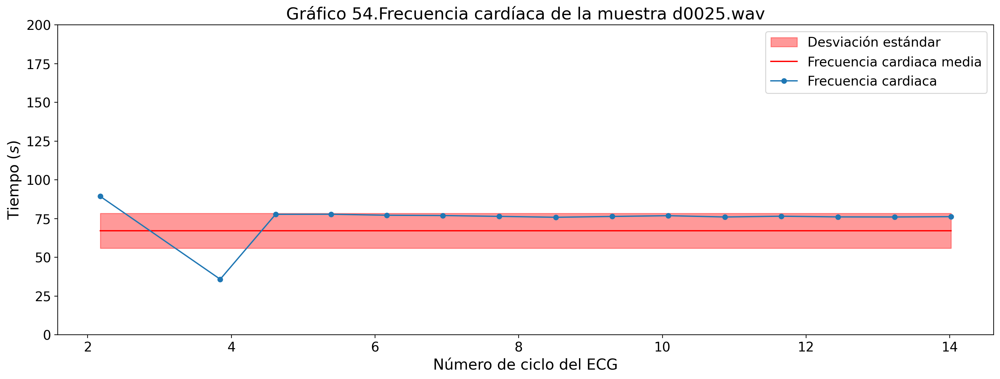

Latidos por minuto de la muestra d0026: 2.821


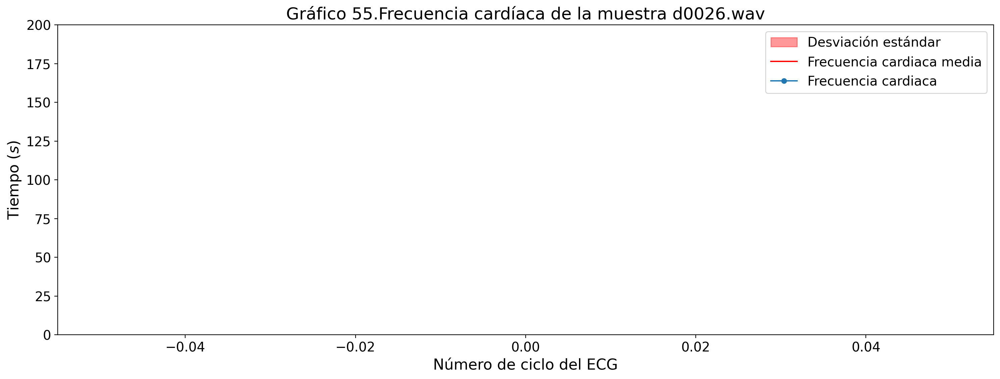

Latidos por minuto de la muestra d0027: 64.677


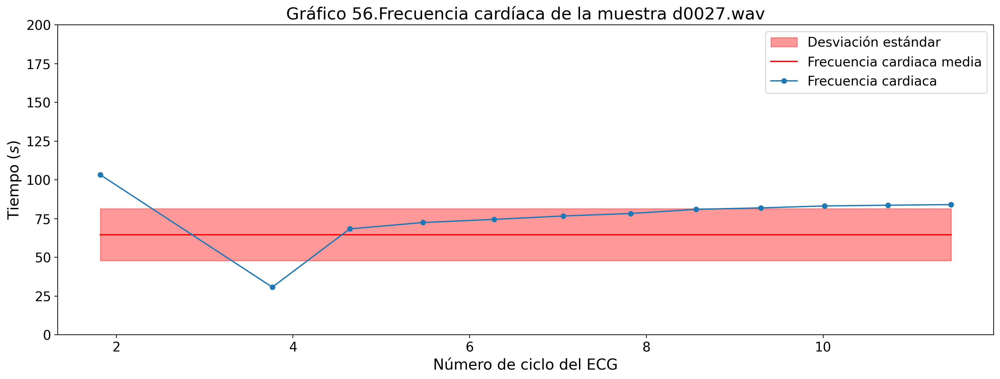

Latidos por minuto de la muestra d0028: 221.504


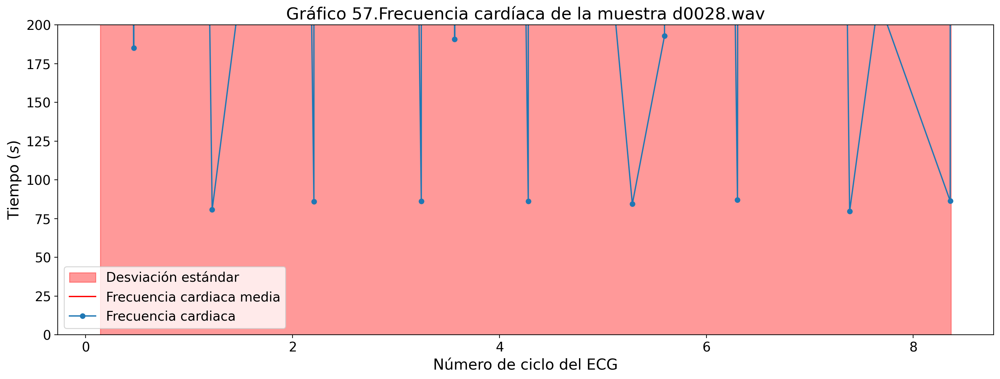

Latidos por minuto de la muestra d0029: 71.208


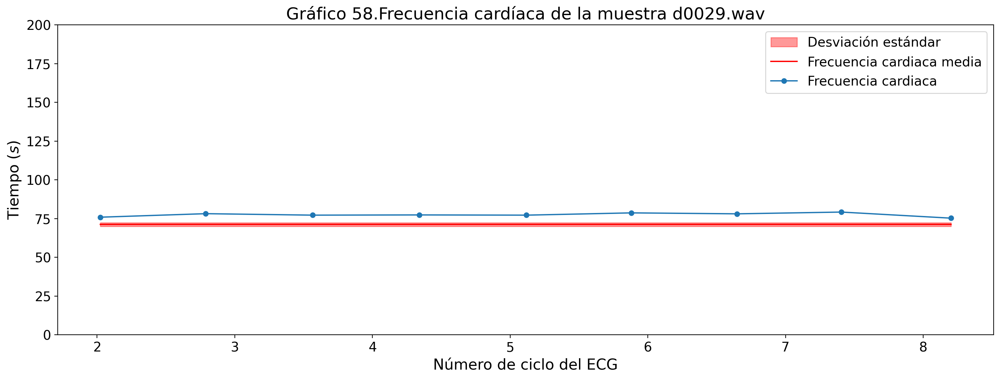

Latidos por minuto de la muestra d0030: 58.676


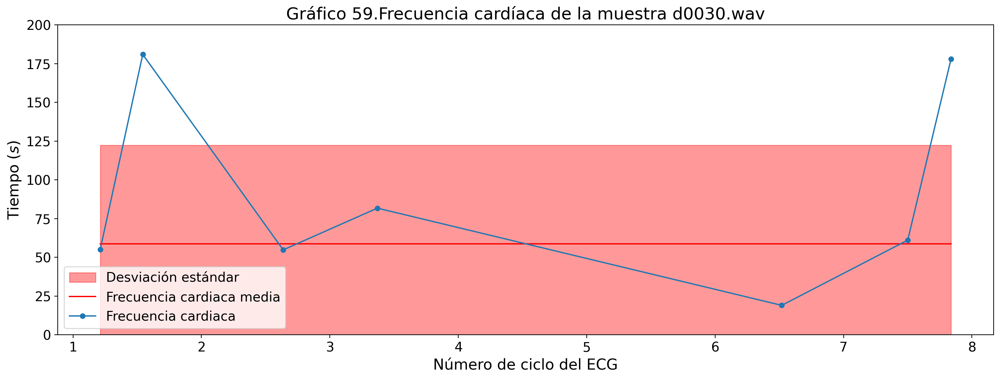

Latidos por minuto de la muestra d0031: 239.12


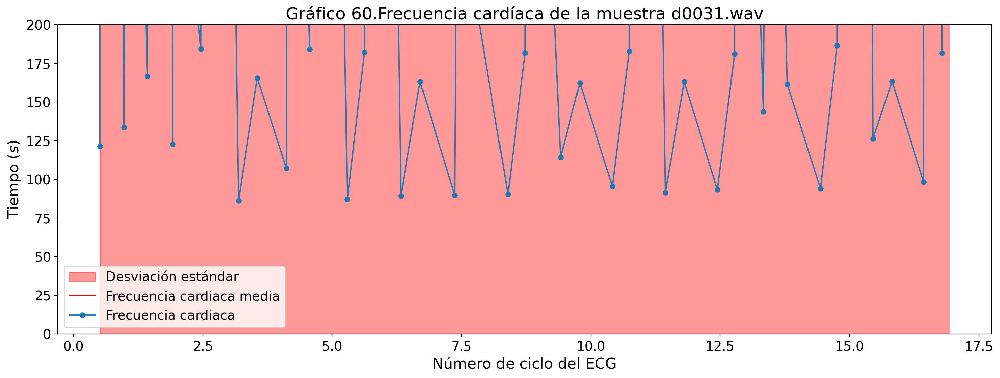

Latidos por minuto de la muestra d0032: 64.272


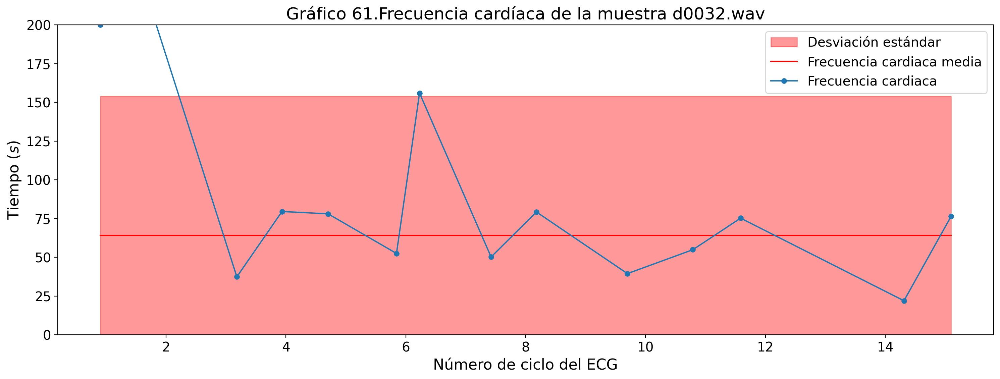

Latidos por minuto de la muestra d0033: 41.482


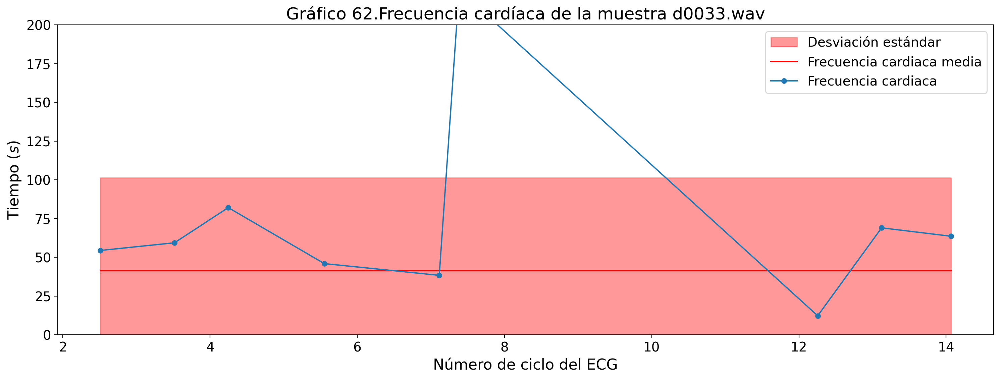

Latidos por minuto de la muestra d0034: 130.761


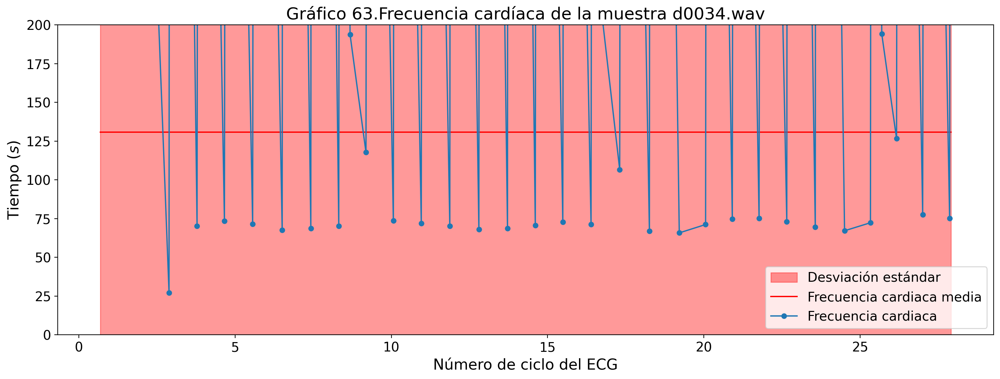

In [11]:
for i in range(20, 35):
    timeECG, waveData = ecg('d00' + str(i) +'.wav')
    mxs_indices = detecta_maximos_locales(timeECG, waveData,0.78)
    mean_bpm = 60*(len(mxs_indices)/(timeECG[-1]-timeECG[0]))
    print("Latidos por minuto de la muestra d00"+str(i)+":", round(mean_bpm,3))
    
    # Graficación de la señal
    plt.figure(figsize=(18,6))
    plt.title('Gráfico ' +  str(contador) + '.Frecuencia cardíaca de la muestra d00' + str(i) +'.wav',)
    heart_rate = [(60/(timeECG[mxs_indices[i+1]]-timeECG[mxs_indices[i]])) \
              for i in range(0, len(mxs_indices)-1)]
    time = timeECG[mxs_indices]
    contador += 1
    mean_vec = [mean_bpm for i in range(0, len(time)-1)]
    std_vec_plus = [mean_bpm+stdev(heart_rate) for i in range(0, len(time)-1)]
    std_vec_minus = [mean_bpm-stdev(heart_rate) for i in range(0, len(time)-1)]
    plt.fill_between(time[1:], std_vec_minus, std_vec_plus, facecolor="red",
                 label = "Desviación estándar", color='red', alpha=0.4)
    plt.plot(time[1:], mean_vec, c="r", label = "Frecuencia cardiaca media")
    plt.plot(time[1:], heart_rate, markersize=5, marker = "o", label="Frecuencia cardiaca")
    plt.ylim((0, 200))
    plt.xlabel(r'Número de ciclo del ECG')
    plt.ylabel(r'Tiempo ($s$)')
    plt.legend()
    plt.show()

A utilizar las muestras seleccionadas se encontro que solo seis de ellas tienen una frecuencia cardiaca normal,entre 60 a 100 latidos por minuto, del resto algunos de los resultados aún pueden ser considerados como normales puesto que hay personas que pueden presentar conciones que reduscan o aumenten su presión cardiada, sin embargo valores como los presentados en la señales d0031, d0028, d0026 y d0022 pueden deberse a un mal funcionaminto del equipo, o ruido en la toma que no permiten detectar correctamente el valor de la frecuencia cardiaca.